In [1]:
import pandas as pd
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 100)
pd.set_option("max_colwidth", 200)

import numpy as np

from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import RepeatedKFold

import matplotlib.pyplot as plt
import seaborn as sns
import shap
shap.initjs()

In [2]:
ordinal = pd.read_csv('../Data/BaseOrdinal.csv')
ordinal.shape

(2580, 83)

In [3]:
ordinal = ordinal.drop(['Unnamed: 0', 'PID', 'Unnamed: 0.1'], axis=1)
ordinal.shape

(2580, 80)

In [4]:
X = ordinal.drop(['SalePrice'], axis=1)
y = ordinal.SalePrice

In [5]:
XGB = XGBRegressor()

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [7]:
XGB.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [8]:
explainer = shap.TreeExplainer(XGB)

In [9]:
shap_values = explainer.shap_values(X)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [10]:
# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [11]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X)

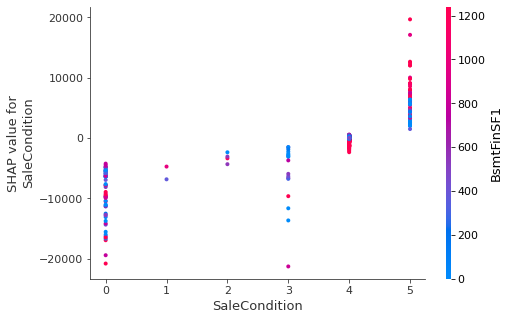

In [12]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("SaleCondition", shap_values, X)

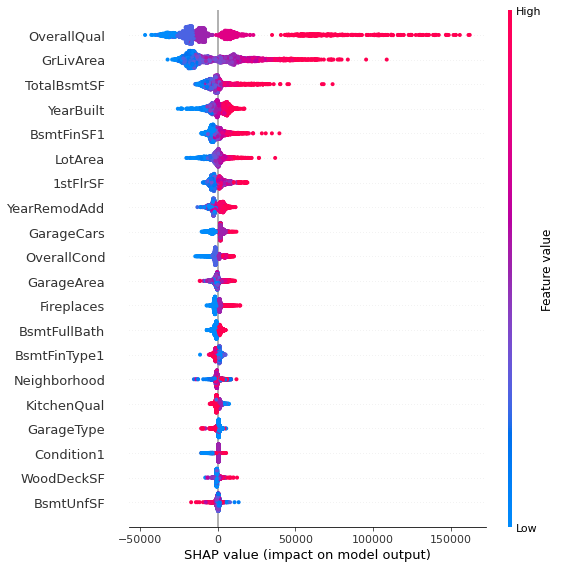

In [13]:
shap.summary_plot(shap_values, X)

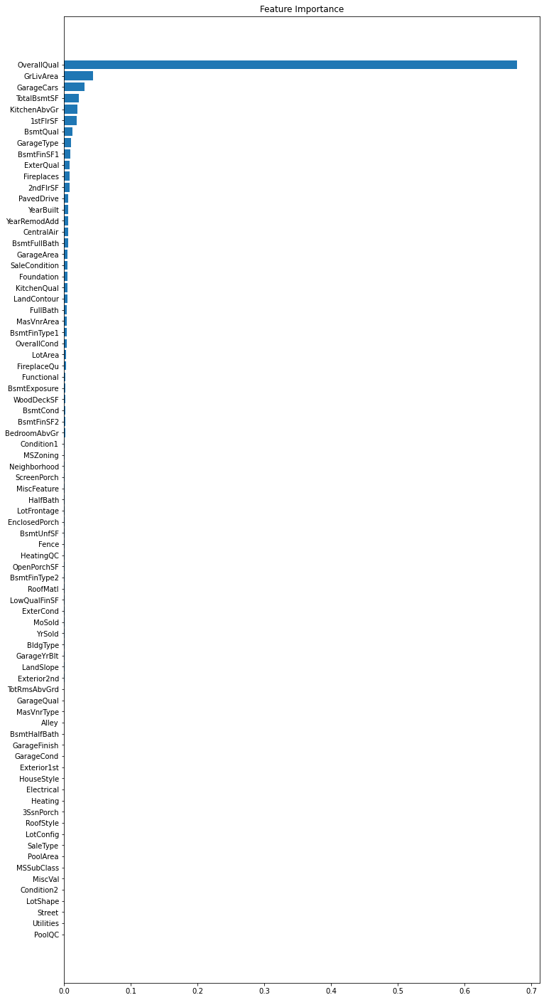

In [14]:
feature_importance = XGB.feature_importances_
sorted_idx = np.argsort(feature_importance)

fig = plt.figure(figsize=(12, 25))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_test.columns)[sorted_idx])
plt.title('Feature Importance');

In [15]:
X_cols = ordinal.drop(['SalePrice'], axis=1).columns
sorted_importance = sorted(zip(X_cols, XGB.feature_importances_), key=lambda t:t[1], reverse=True)
sorted_importance

[('OverallQual', 0.6781164),
 ('GrLivArea', 0.043361314),
 ('GarageCars', 0.030923434),
 ('TotalBsmtSF', 0.022362346),
 ('KitchenAbvGr', 0.020743819),
 ('1stFlrSF', 0.019496245),
 ('BsmtQual', 0.013104383),
 ('GarageType', 0.010327056),
 ('BsmtFinSF1', 0.009161098),
 ('ExterQual', 0.0088562565),
 ('Fireplaces', 0.008502123),
 ('2ndFlrSF', 0.008140221),
 ('PavedDrive', 0.0069533805),
 ('YearBuilt', 0.006944358),
 ('YearRemodAdd', 0.0068502035),
 ('CentralAir', 0.006675307),
 ('BsmtFullBath', 0.0059660817),
 ('GarageArea', 0.005774269),
 ('SaleCondition', 0.0056525283),
 ('Foundation', 0.0056520104),
 ('KitchenQual', 0.005353947),
 ('LandContour', 0.005019581),
 ('FullBath', 0.0043817917),
 ('MasVnrArea', 0.004292817),
 ('BsmtFinType1', 0.004174517),
 ('OverallCond', 0.003798358),
 ('LotArea', 0.00334682),
 ('FireplaceQu', 0.0027784747),
 ('Functional', 0.0024178291),
 ('BsmtExposure', 0.0022860689),
 ('WoodDeckSF', 0.0020653678),
 ('BsmtCond', 0.002019692),
 ('BsmtFinSF2', 0.0017570528)